# 5. Filtrado

Filtrar imágenes está en el núcleo del procesamiento de imágenes. La idea es usar una pequeña imagen que se desplace a lo largo de una imagen más grande y realice alguna operación en cada sub-región de esta imagen más grande. En el caso más simple, podemos imaginar que un pequeño cuadrado se desplaza por la imagen y calcula el *promedio local* de los píxeles con los que se superpone. Esto sería un filtro de promedio:

In [ ]:
from IPython.display import HTML, display
HTML(filename='/content/convol_mean.html')

Varias propiedades del *pequeño cuadrado que viaja* pueden cambiar:
 - Los valores de los píxeles del cuadrado pueden ser cualquiera. Por ejemplo, es común tener un Gaussiano 2D para suavizar la imagen (ver abajo).
 - El tamaño y la forma del cuadrado pueden cambiar.
 - La operación realizada por el cuadrado no tiene que ser una simple multiplicación-suma (convolución). También puede ser otra función como una mediana, por ejemplo.

 Los filtros pueden aplicarse a imágenes regulares, así como a máscaras (imágenes binarias), y a menudo se usan para limpiar una imagen o para detectar objetos. Vamos a ver algunos ejemplos de filtros utilizando `cv2`.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

## Filtros lineales

### Efecto de desenfoque

Los filtros lineales funcionan convolucionando una imagen con una plantilla más pequeña. Esa pequeña plantilla puede ser cualquier cosa, pero comúnmente es una matriz pequeña bien definida. Por ejemplo, puede ser una Gaussiana 2D. Podemos observar su forma real filtrando una imagen que tiene un solo píxel encendido:


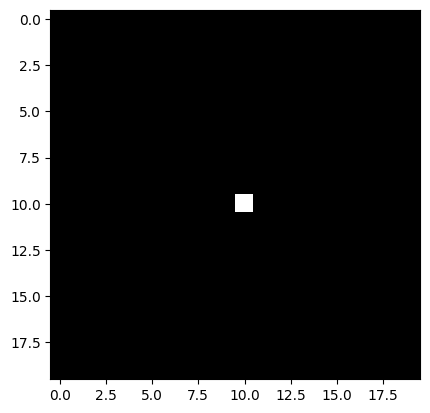

In [ ]:
single_dot = np.zeros((20,20))
single_dot[10,10] = 1
plt.imshow(single_dot, cmap='gray');

El filtro Gaussiano tiene valores por defecto y podemos aplicarlo simplemente en una imagen:


In [ ]:
filtered = cv2.GaussianBlur(single_dot, (7,7), 0)


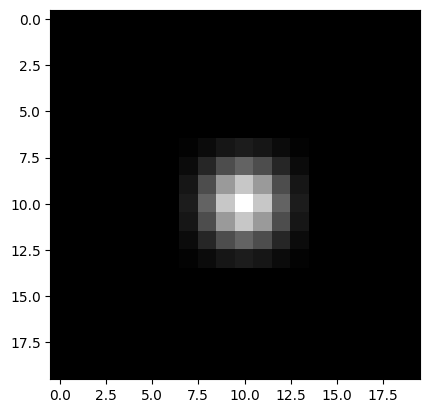

In [ ]:
plt.imshow(filtered, cmap='gray');


Podemos trazar una sección transversal para entender mejor lo que sucedió:


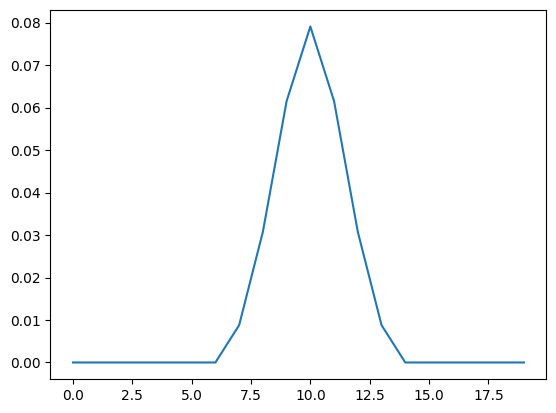

In [ ]:
plt.plot(filtered[10,:]);

El efecto de este filtrado fue "ensanchar" el píxel original, que ahora se ha dispersado por la imagen. También podemos especificar el ancho de la Gaussiana:


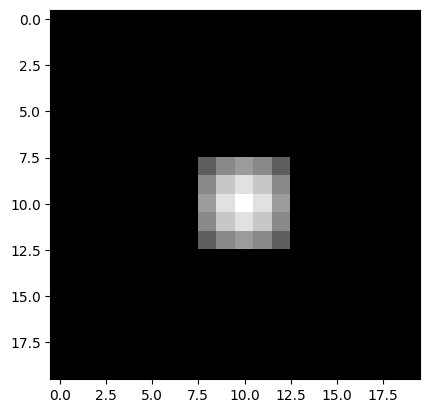

In [ ]:
filtered = cv2.GaussianBlur(single_dot, (5,5), 2)
plt.imshow(filtered, cmap='gray');

La Gaussiana se ha ensanchado aún más. Ahora pongamos dos puntos en nuestra imagen y veamos qué sucede:


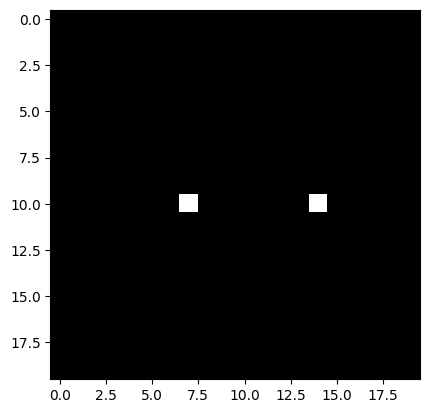

In [ ]:
double_dot = np.zeros((20,20))
double_dot[10,7] = 1
double_dot[10,14] = 1
plt.imshow(double_dot, cmap='gray');


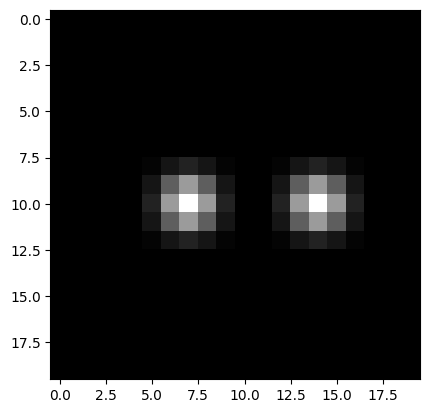

In [ ]:
filtered = cv2.GaussianBlur(double_dot, (5,5),1)
plt.imshow(filtered, cmap='gray');

El efecto final es desenfocar nuestra imagen. Si aplicamos nuestro filtro dos veces obtenemos una imagen aún más borrosa:


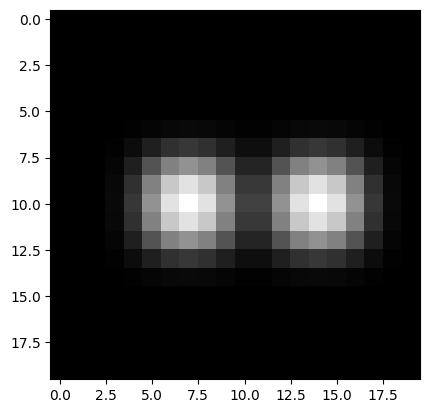

In [ ]:
filtered2 = cv2.GaussianBlur(filtered, (5,5), 2)
plt.imshow(filtered2, cmap='gray');

### Eliminando el ruido

El filtrado Gaussiano no solo desenfoca la información, también ayuda a eliminar el ruido. Vamos a tomar nuevamente nuestra imagen desenfocada y agregarle algo de ruido. Para eso usamos el módulo aleatorio de numpy:


In [ ]:
noisy = filtered + 0.06*np.random.rand(20,20)

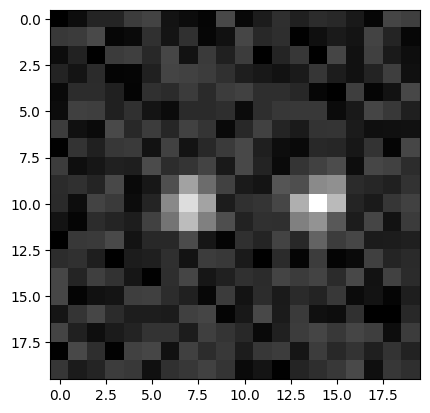

In [ ]:
plt.imshow(noisy, cmap = 'gray');

Si aplicamos nuevamente nuestro filtro gaussiano:

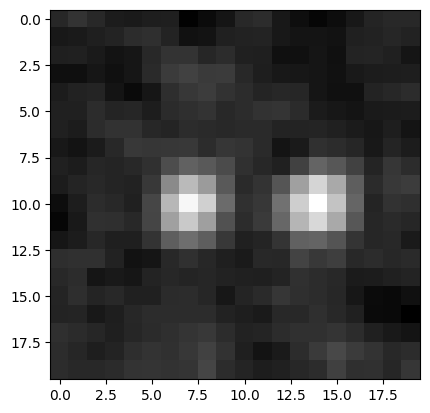

In [ ]:
noise_filtered = cv2.GaussianBlur(noisy, (3,3), 2)
plt.imshow(noise_filtered, cmap='gray');

Obtenemos una imagen que, por supuesto, está desenfocada, pero donde el ruido fuerte ha desaparecido en su mayoría.


### Filtrando una imagen

Hemos estado jugando aquí con imágenes de un solo píxel, pero por supuesto, el objetivo es aplicar dicho filtro a una imagen real. Vamos a importar una y ajustar el ancho de nuestra Gaussiana para ver su efecto en una imagen real:


In [ ]:
import cv2
import numpy as np
import urllib.request

url = 'https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif'
resp = urllib.request.urlopen(url)
image = np.asarray(bytearray(resp.read()), dtype="uint8")
image_stack = cv2.imdecode(image, cv2.IMREAD_UNCHANGED)

#image_stack = cv2.imread('https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif', cv2.IMREAD_UNCHANGED)
image_nuclei = image_stack[1250:1750,300:800,2]

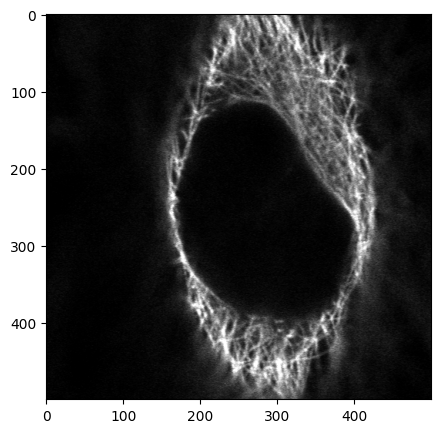

In [ ]:
plt.subplots(figsize=(5,5))
plt.imshow(image_nuclei, cmap='gray')

In [ ]:
image_nuclei.shape

(500, 500)

In [ ]:
#dimension debe ser d%2==1
filtered_image = cv2.GaussianBlur(image_nuclei, (21,21), 5)

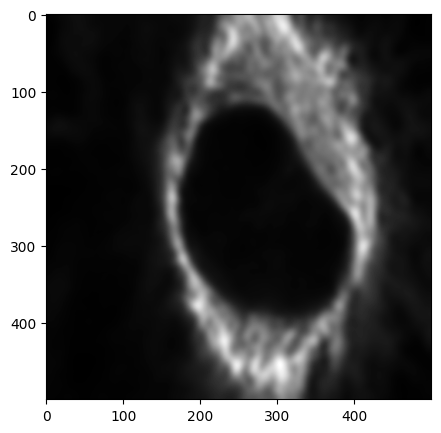

In [ ]:
plt.subplots(figsize=(5,5))
plt.imshow(filtered_image, cmap='gray');

In [ ]:
filtered_image = cv2.GaussianBlur(image_nuclei, (11,11), 40)


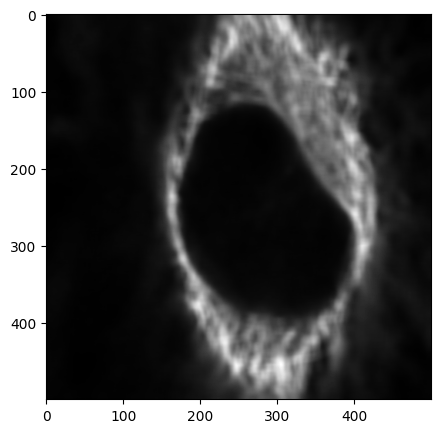

In [ ]:
plt.subplots(figsize=(5,5))
plt.imshow(filtered_image, cmap='gray');

El filtrado de imágenes es, por supuesto, un tema **amplio**, y deberías leer más al respecto si lo necesitas en tu trabajo. Este ejemplo solo ilustra cómo usar filtros en Python utilizando opencv
.


## Filtros no lineales

Otra clase de filtros no utiliza la convolución para filtrar la imagen, sino que realiza otro tipo de operación en pequeños vecindarios de la imagen. Por ejemplo, puede calcular el valor mediano de cada sub-región de 3x3 en la imagen. Esto es extremadamente útil si nuestra imagen tiene píxeles que están "muertos" o tienen valores extremadamente grandes.

 Con fines de ilustración, podemos crear artificialmente una imagen de este tipo usando una utilidad de `cv2` para agregar ruido:


In [ ]:
original=np.copy(image_nuclei)
noise = np.zeros_like(image_nuclei)
cv2.randn(noise, 0, 100)
image_noisy=cv2.add(noise,original )
_,image_noisy2 = cv2.threshold(image_noisy, 127, 255, cv2.THRESH_BINARY) # Simula el ruido de "sal y pimienta"


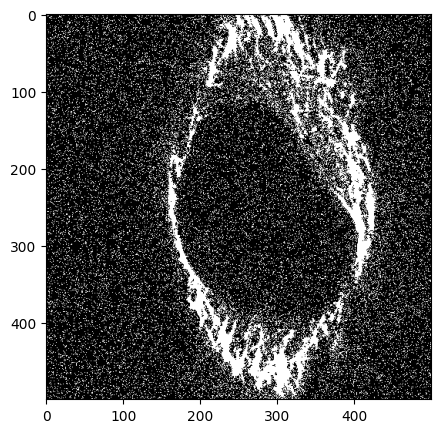

In [ ]:
plt.subplots(figsize=(5,5))
plt.imshow(image_noisy2, cmap='gray');

Si aplicamos un filtro de mediana de tamaño 3x3, los píxeles que están completamente fuera de rango serán reemplazados por el valor mediano de su entorno. Los demás se verán ligeramente afectados:


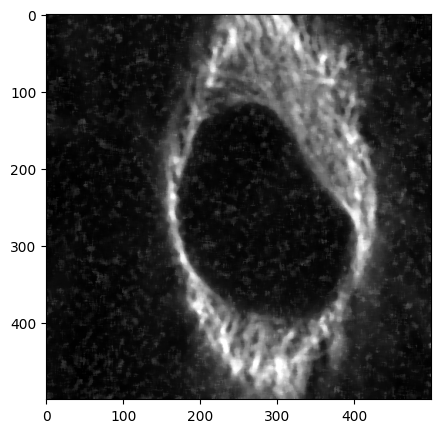

In [ ]:
filtered_median = cv2.medianBlur(image_noisy.astype(np.uint8), 7)

plt.subplots(figsize=(5,5))
plt.imshow(filtered_median, cmap='gray');

¡Esto es un éxito total!

### Otros elementos de selección

Hasta ahora hemos confiado en las regiones predeterminadas consideradas para el filtrado. Por ejemplo, el filtro de mediana opera de forma predeterminada en regiones cuadradas de 3x3. Sin embargo, podemos especificar cualquier otra forma o *huella* (footprint). Por ejemplo, podemos usar una matriz de Numpy:


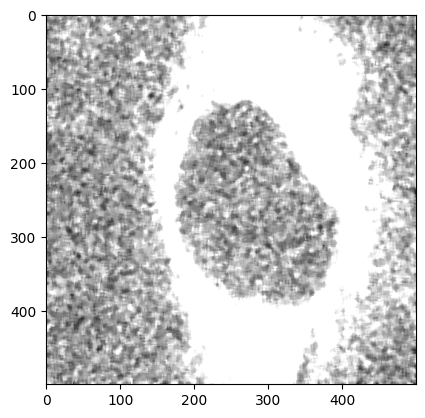

In [ ]:
footprint = np.ones((2,2), dtype=np.uint8)
filtered_median = cv2.medianBlur(cv2.filter2D(image_noisy.astype(np.uint8), -1, footprint), 7)
plt.imshow(filtered_median, cmap='gray');

In [ ]:
filtered_median = cv2.medianBlur(cv2.filter2D(image_noisy.astype(np.uint8), -1, footprint), 5)
print(filtered_median)

[[  4  26 209 ... 153 141 213]
 [ 26 140 209 ... 213 226 240]
 [180 180 180 ... 213 226 213]
 ...
 [227 231 231 ... 130 133 133]
 [226 227 231 ...  91 124  69]
 [226 226 227 ...  83  69  59]]


O podemos usar formas predefinidas que están disponibles directamente en `cv2`. Por ejemplo, un disco con un cierto radio:


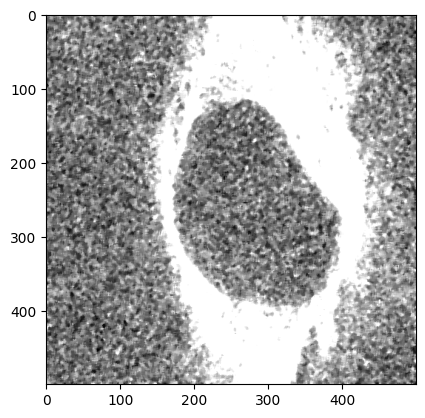

In [ ]:
footprint = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2,2))
filtered_median = cv2.medianBlur(cv2.filter2D(image_noisy.astype(np.uint8), -1, footprint), 5)
plt.imshow(filtered_median, cmap='gray');

## Filtros morfológicos

Al trabajar con máscaras, se puede usar otra clase de filtros que simplemente activan o desactivan píxeles dependiendo de su entorno. Los más simples de entender son los filtros de erosión y dilatación. Como su nombre lo indica, estos filtros encogen o agrandan los objetos activados. El tamaño y la forma de los filtros especifican qué región se considera alrededor de los objetos para encogerlos o agrandarlos. Aquí nuevamente usamos el argumento `footprint` para especificar dichos elementos estructurales.

 Vamos a crear una máscara simple usando un umbral de Otsu:


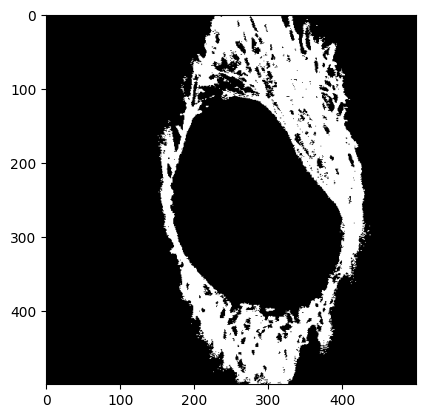

In [ ]:
_, mask = cv2.threshold(image_nuclei, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.imshow(mask, cmap='gray');

Podemos especificar la región de influencia como una matriz de Numpy. Por ejemplo, un cuadrado de tamaño 5:


In [ ]:
influence_region = np.ones((5,5))

In [ ]:
eroded = cv2.erode(mask, influence_region)

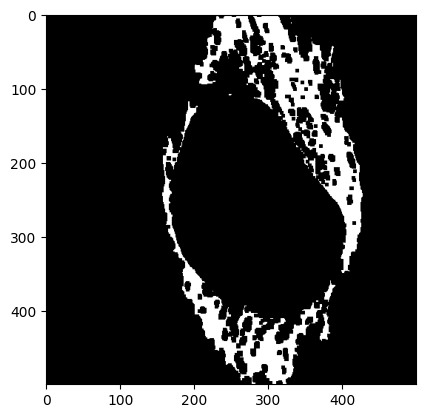

In [ ]:
plt.imshow(eroded, cmap='gray');

Podemos erosionar aún más:

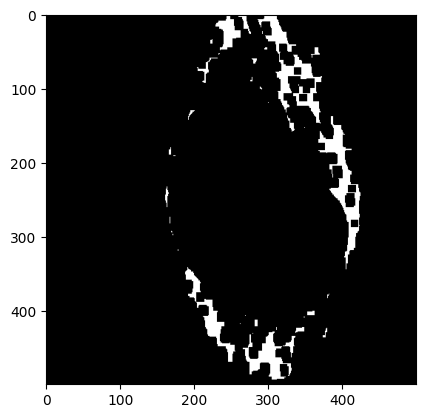

In [ ]:
influence_region = np.ones((10,10), dtype=np.uint8)

eroded = cv2.erode(mask, influence_region)

plt.imshow(eroded, cmap='gray');

Podemos hacer lo contrario y dilatar nuestra imagen:

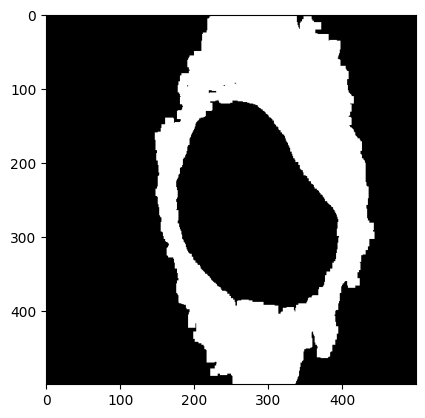

In [ ]:
influence_region = np.ones((10,10), dtype=np.uint8)

dilated = cv2.dilate(mask, influence_region)

plt.imshow(dilated, cmap='gray');

¿Cómo son útiles estos operadores en el procesamiento de imágenes? Imaginemos nuevamente que tenemos una imagen ruidosa. Nuestra máscara se vería así:


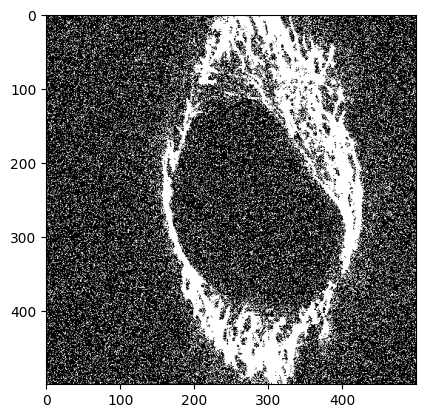

In [ ]:
_, mask_noisy = cv2.threshold(image_noisy, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.imshow(mask_noisy, cmap='gray');

Ahora podemos rellenar los pequeños agujeros en los núcleos con una pequeña dilatación:


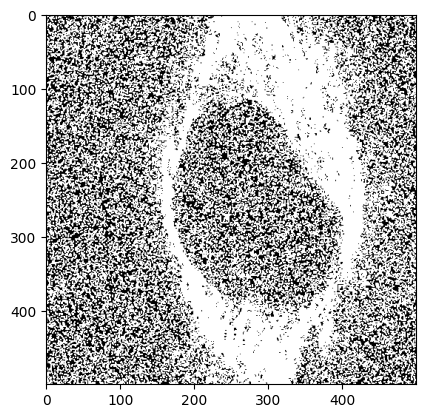

In [ ]:
influence_region = np.ones((2,2), dtype=np.uint8)

step1 = cv2.dilate(mask_noisy, influence_region)

plt.imshow(step1, cmap='gray');

Y erosionar nuevamente para devolver los núcleos a su tamaño original:


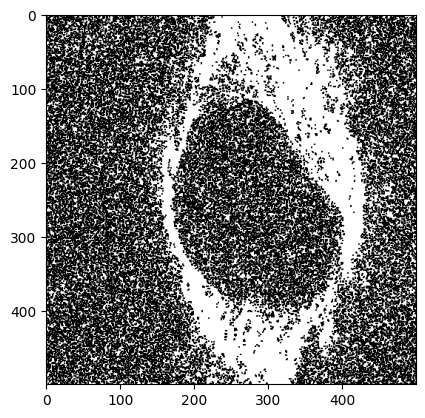

In [ ]:
influence_region = np.ones((2,2), dtype=np.uint8)

step2 = cv2.erode(step1, influence_region)

plt.imshow(step2, cmap='gray');

Aún tenemos algo de ruido. Entonces podemos hacer otra ronda donde primero erosionamos la imagen (para eliminar el polvo) y luego la dilatamos nuevamente para recuperar núcleos de tamaño correcto:


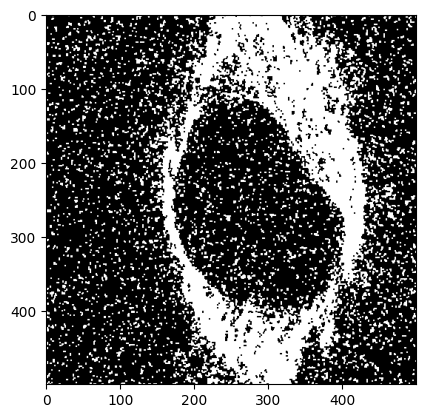

In [ ]:
step3 = cv2.erode(step2, influence_region)
step4 = cv2.dilate(step3, influence_region)

plt.imshow(step4, cmap='gray');

La combinación de erosión y dilatación se define como operadores específicos (apertura, cierre) y son ampliamente utilizados. Por ejemplo, el filtro `closing` aplica primero una dilatación y luego una erosión:


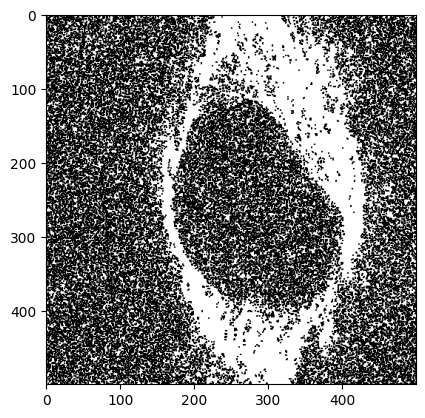

In [ ]:
plt.imshow(cv2.morphologyEx(mask_noisy, cv2.MORPH_CLOSE, influence_region), cmap='gray');


Existen otros operadores morfológicos. Por ejemplo, se puede reducir al máximo todas las estructuras de la imagen usando la función de esqueletización:



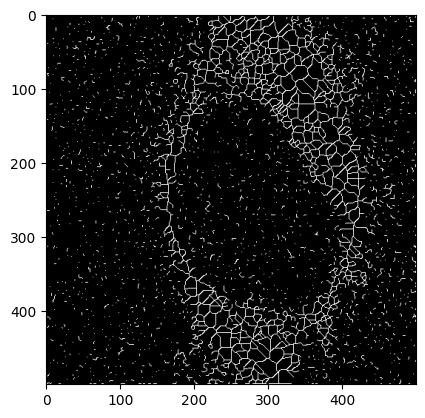

In [ ]:
skeleton = cv2.ximgproc.thinning(step4.astype(np.uint8))

plt.imshow(skeleton, cmap='gray');

## Otros paquetes
Por supuesto, puedes encontrar funciones útiles en otros paquetes. Un ejemplo de esto se da en el cuaderno de demostración, donde *rellenamos los agujeros* que tenemos en nuestros núcleos con una función del paquete `scipy`:


In [ ]:
import scipy.ndimage as ndi

In [ ]:
image_closed = cv2.morphologyEx(mask_noisy, cv2.MORPH_CLOSE, influence_region)


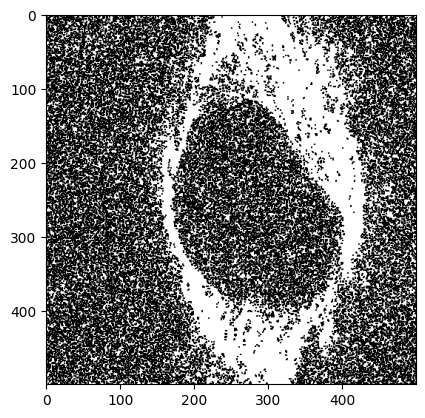

In [ ]:
plt.imshow(image_closed, cmap='gray');

In [ ]:
image_fill = ndi.binary_fill_holes(image_closed)

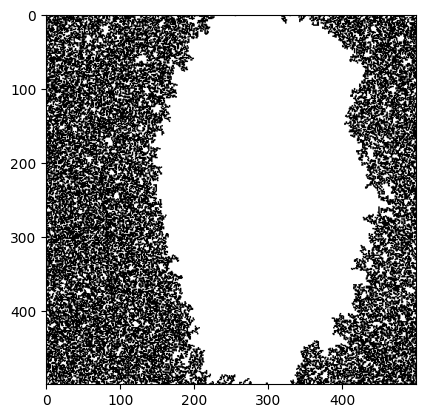

In [ ]:
plt.imshow(image_fill, cmap='gray');